In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy
from scipy.interpolate import interp1d
from scipy.signal import spectrogram
from scipy.stats import kurtosis

In [3]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# 1. Loading data files

In [4]:
data_folder = "/content/drive/MyDrive/CS506_DS/Defect_Detection/"

In [5]:
# Load csv from directory
cube_clog0_csv = data_folder + "adxl_cube_clog0.csv"
frog_clog0_csv = data_folder + "adxl_frog_clog0.csv"

# the following models have a separate features file with rolling rms, kurtosis, etc
octopus_clog0_csv = data_folder + "octopus_clog0_raw.csv"
octopus_clog0_feat_csv = data_folder + "octopus_clog0_features.csv"

snowflake_clog0_csv = data_folder + "snowflake_clog0__raw.csv"
snowflake_clog0_feat_csv = data_folder + "snowflake_clog0__features.csv"

snowflake_partial0_csv = data_folder + "snowflake_normal0_raw.csv"
snowflake_partial0_feat_csv = data_folder + "snowflake_normal0_features.csv"

In [6]:
octopus_partial0_csv = data_folder + "octopus_partial0_raw.csv"
octopus_partial0_feat_csv = data_folder + "octopus_partial0_features.csv"

In [7]:
snowflake_partial1_csv = data_folder + "snowflake_partial1_raw.csv"
snowflake_partial1_feat_csv = data_folder + "snowflake_partial1_features.csv"

In [26]:
cylinder_clog0_csv = data_folder + "cylinder_clog0_raw.csv"
cylinder_clog0_feat_csv = data_folder + "cylinder_clog0_features.csv"

cylinder_partial0_csv = data_folder + "cylinder_partial0_raw.csv"
cylinder_partial0_feat_csv = data_folder + "cylinder_partial0_features.csv"

# 2. Formatting data files

In [10]:
# Reformat the csv to normalize timestamps and convert to H:M:S
def formatCSV(input_file):
  csvfile = pd.read_csv(input_file)
  # set timestamp to start from 0
  csvfile["timestamp"] = pd.to_numeric(csvfile["timestamp"], errors="coerce")
  csvfile["time_s"] = csvfile["timestamp"] - csvfile["timestamp"].iloc[0]
  csvfile["time_min"] = pd.to_datetime(csvfile["time_s"], unit="s").dt.strftime('%H:%M:%S.%f')[:-3]
  csvfile.set_index("time_min", inplace=True)  # set H:M:S timestamp as index for plotting
  return csvfile

In [11]:
def formatCSV_features(input_file):
  csvfile = pd.read_csv(input_file)
  # set timestamp to start from 0
  csvfile["timestamp"] = pd.to_datetime(csvfile["timestamp"], utc=True, errors="coerce")
  csvfile = csvfile.dropna(subset=["timestamp"])
  csvfile["time_s"] = (csvfile["timestamp"] - csvfile["timestamp"].iloc[0]).dt.total_seconds()
  csvfile["time_min"] = pd.to_datetime(csvfile["time_s"], unit="s").dt.strftime('%H:%M:%S.%f').str[:-3]
  csvfile.set_index("time_min", inplace=True)
  return csvfile

Reformatting files for fully clogged snowflake print

In [12]:
snowflake_clog0 = formatCSV(snowflake_clog0_csv)
snowflake_clog0.head()

,timestamp,x,y,z,time_s
time_min,,,,,
00:00:00.000000,173697.872053,-666.185348,740.205942,-9959.241474,0.000000
00:00:00.000318,173697.872371,-814.226536,962.267725,-9806.022374,0.000318
00:00:00.000636,173697.872689,-592.164754,1110.308913,-9806.022374,0.000636
00:00:00.000954,173697.873007,-222.061783,1480.411884,-9346.365076,0.000954
00:00:00.001272,173697.873325,0.000000,1332.370696,-9116.536426,0.001272


In [13]:
snowflake_clog0_features = formatCSV_features(snowflake_clog0_feat_csv)
snowflake_clog0_features.head()

,timestamp,x_rms,y_rms,z_rms,x_std,y_std,z_std,x_mean,y_mean,z_mean,x_kurt,y_kurt,z_kurt,x_crest,y_crest,z_crest,time_s
time_min,,,,,,,,,,,,,,,,,
00:00:00.000,2025-10-23 15:50:21.733872+00:00,622.147388,570.434103,-248.339094,4.102317,3.688255,591.223327,573.083813,145.327100,2.853925,3.255175,10194.853079,665.482002,-10173.109801,2.729946,1.172267,0.000000
00:00:00.096,2025-10-23 15:50:21.830070+00:00,729.027701,684.414139,-251.114866,3.699379,3.249066,570.240889,552.079879,142.767221,2.985973,3.374952,10202.700602,691.991098,-10179.206644,2.757608,1.201400,0.096198
00:00:00.198,2025-10-23 15:50:21.932014+00:00,714.580570,688.506702,-191.269215,3.421200,3.314754,583.496414,562.164148,156.331495,2.927914,3.298282,10204.754082,675.005483,-10182.405093,2.772440,1.201159,0.198142
00:00:00.206,2025-10-23 15:50:21.940206+00:00,753.938905,727.994704,-196.080554,3.237414,3.141712,625.480591,596.787340,187.272103,3.412682,3.786942,10219.356445,707.796684,-10194.815840,2.752877,1.199442,0.206334
00:00:00.302,2025-10-23 15:50:22.036002+00:00,803.623016,770.408531,-228.649615,2.892329,2.947475,733.226202,694.039192,236.495798,4.450549,4.542836,10197.615993,752.132565,-10169.841126,2.812064,1.201999,0.302130


Reformatting files for partially clogged snowflake print

In [14]:
snowflake_partial0 = formatCSV(snowflake_partial0_csv)
snowflake_partial0.head()

,timestamp,x,y,z,time_s
time_min,,,,,
00:00:00.000000,544.382960,148.041188,666.185348,-11261.603821,0.000000
00:00:00.000318,544.383278,-370.102971,222.061783,-10648.727422,0.000318
00:00:00.000636,544.383596,-814.226536,-222.061783,-10495.508323,0.000636
00:00:00.000954,544.383914,-1332.370696,-666.185348,-9882.631924,0.000954
00:00:00.001272,544.384232,-1406.391290,-666.185348,-9576.193725,0.001272


In [15]:
snowflake_partial0_features = formatCSV_features(snowflake_partial0_feat_csv)
snowflake_partial0_features.head()

,timestamp,x_rms,y_rms,z_rms,x_std,y_std,z_std,x_mean,y_mean,z_mean,x_kurt,y_kurt,z_kurt,x_crest,y_crest,z_crest,time_s
time_min,,,,,,,,,,,,,,,,,
00:00:00.000,2025-10-26 18:39:03.674534+00:00,591.331436,533.582502,-254.877579,2.083757,2.503523,716.561153,704.936178,128.549099,1.980983,2.582494,10356.860782,934.858975,-10314.582102,1.988845,1.190915,0.000000
00:00:00.088,2025-10-26 18:39:03.762876+00:00,594.744074,539.173718,-251.022340,2.102773,2.613616,712.460235,701.833070,122.596609,1.998832,2.597359,10359.056315,962.645897,-10314.230975,2.050080,1.220244,0.088342
00:00:00.188,2025-10-26 18:39:03.863487+00:00,598.597365,542.915522,-252.114144,2.117613,2.596791,716.934450,706.106309,124.132536,2.051108,2.581149,10358.960778,998.496838,-10310.726088,2.074871,1.242442,0.188953
00:00:00.202,2025-10-26 18:39:03.877251+00:00,600.822022,548.497253,-245.230229,2.122069,2.587176,736.982729,725.601768,129.017896,2.023288,2.510934,10374.814163,1062.878630,-10320.225673,2.118415,1.240543,0.202717
00:00:00.293,2025-10-26 18:39:03.967696+00:00,612.790387,563.405476,-241.011055,2.142452,2.536646,743.463084,732.012646,129.980163,2.071796,2.489047,10363.288996,1088.398547,-10305.976296,2.124986,1.241923,0.293162


Reformatting files for clogged & partially clogged octopus

In [16]:
octopus_clog0 = formatCSV(octopus_clog0_csv)
octopus_clog0.head()

,timestamp,x,y,z,time_s
time_min,,,,,
00:00:00.000000,176491.597265,-1258.350101,-740.205942,-12563.966167,0.000000
00:00:00.000318,176491.597583,-962.267725,-666.185348,-12257.527968,0.000318
00:00:00.000635,176491.597900,-222.061783,-666.185348,-11108.384721,0.000635
00:00:00.000953,176491.598218,0.000000,0.000000,-10112.460574,0.000953
00:00:00.001270,176491.598535,444.123565,0.000000,-9346.365076,0.001270


In [17]:
octopus_clog0_features = formatCSV_features(octopus_clog0_feat_csv)
octopus_clog0_features.head()

,timestamp,x_rms,y_rms,z_rms,x_std,y_std,z_std,x_mean,y_mean,z_mean,x_kurt,y_kurt,z_kurt,x_crest,y_crest,z_crest,time_s
time_min,,,,,,,,,,,,,,,,,
00:00:00.000,2025-10-23 16:36:55.384982+00:00,1456.520168,1436.391961,-241.307137,5.927882,5.132837,1772.704373,1766.787971,144.710262,5.505807,4.175575,10528.023074,2197.184946,-10296.195811,5.046612,1.862842,0.000000
00:00:00.098,2025-10-23 16:36:55.483878+00:00,1426.911354,1402.141709,-264.716150,5.798158,5.239344,1737.768439,1729.972771,164.418245,5.261976,4.259520,10529.113795,2258.367668,-10284.065965,5.783210,1.979065,0.098896
00:00:00.198,2025-10-23 16:36:55.583806+00:00,1387.261267,1365.400911,-245.304249,5.677633,5.389093,1717.778628,1711.540257,146.264694,5.199720,4.309088,10509.520753,2278.517413,-10259.550909,5.382885,1.982754,0.198824
00:00:00.207,2025-10-23 16:36:55.592148+00:00,1516.150661,1494.261081,-256.703421,7.931846,6.053853,1814.431844,1809.312867,136.197893,5.833454,5.140229,10489.495826,2148.727407,-10267.058645,5.649251,1.986539,0.207166
00:00:00.295,2025-10-23 16:36:55.680922+00:00,1493.129511,1471.436556,-253.594556,8.085420,6.147192,1856.905122,1851.727827,138.566552,5.571898,5.022656,10550.832020,2459.810451,-10260.087176,4.918883,1.974991,0.295940


In [18]:
octopus_partial0 = formatCSV(octopus_partial0_csv)
octopus_partial0.head()

,timestamp,x,y,z,time_s
time_min,,,,,
00:00:00.000000,265.236269,74.020594,666.185348,-11414.822920,0.000000
00:00:00.000318,265.236587,1110.308913,518.144159,-10801.946522,0.000318
00:00:00.000636,265.236905,444.123565,444.123565,-11338.213370,0.000636
00:00:00.000954,265.237223,444.123565,0.000000,-10801.946522,0.000954
00:00:00.001272,265.237541,-148.041188,0.000000,-10418.898773,0.001272


In [19]:
octopus_partial0_features = formatCSV_features(octopus_partial0_feat_csv)
octopus_partial0_features.head()

,timestamp,x_rms,y_rms,z_rms,x_std,y_std,z_std,x_mean,y_mean,z_mean,x_kurt,y_kurt,z_kurt,x_crest,y_crest,z_crest,time_s
time_min,,,,,,,,,,,,,,,,,
00:00:00.000,2025-10-27 14:28:57.321112+00:00,503.149510,429.607757,-261.909536,2.686658,2.500947,478.908096,462.811196,123.120922,2.553865,2.936662,10337.117731,799.481728,-10306.155052,1.939422,1.163545,0.000000
00:00:00.086,2025-10-27 14:28:57.407501+00:00,487.068728,409.927166,-263.050687,2.738861,2.583517,459.330442,443.451899,119.728311,2.687904,3.061829,10330.058512,762.512301,-10301.877685,2.027479,1.164340,0.086389
00:00:00.189,2025-10-27 14:28:57.510765+00:00,472.150443,392.814949,-261.958883,2.809225,2.665147,452.574044,435.927578,121.615836,2.698992,3.107539,10333.967781,719.534184,-10308.887459,2.156918,1.163899,0.189653
00:00:00.203,2025-10-27 14:28:57.524602+00:00,450.219274,369.092773,-257.813730,2.797868,2.794972,435.320394,417.422594,123.540372,2.692963,2.890630,10330.410191,659.345688,-10309.347117,2.402811,1.164300,0.203490
00:00:00.294,2025-10-27 14:28:57.615300+00:00,425.949771,341.682655,-254.334762,2.730331,2.954222,403.279794,384.551905,121.467795,2.817186,3.120290,10319.540393,562.211754,-10304.214277,2.723941,1.158103,0.294188


Reformatting files for clogged & partially clogged cylinder:

In [27]:
cylinder_clog0 = formatCSV(cylinder_clog0_csv)
cylinder_clog0_features = formatCSV_features(cylinder_clog0_feat_csv)
cylinder_partial0 = formatCSV(cylinder_partial0_csv)
cylinder_partial0_features = formatCSV_features(cylinder_partial0_feat_csv)
cylinder_partial0_features.head()

,timestamp,x_rms,y_rms,z_rms,x_std,y_std,z_std,x_mean,y_mean,z_mean,x_kurt,y_kurt,z_kurt,x_crest,y_crest,z_crest,time_s
time_min,,,,,,,,,,,,,,,,,
00:00:00.000,2025-10-27 14:57:27.018075+00:00,503.584902,405.997224,-297.932892,2.695585,2.939746,411.419576,393.481408,-120.160098,2.747535,3.058557,10288.008893,720.578679,-10262.742974,2.452906,1.191438,0.000000
00:00:00.089,2025-10-27 14:57:27.107483+00:00,502.168499,402.316740,-300.523612,2.650254,2.948038,405.106401,388.629091,-114.361818,2.689801,3.106221,10298.611835,734.542750,-10272.383009,2.396507,1.190212,0.089408
00:00:00.185,2025-10-27 14:57:27.203405+00:00,503.601222,406.180320,-297.710830,2.619594,2.939651,412.042803,395.939742,-114.065736,2.730958,3.053931,10293.007772,736.854274,-10266.598988,2.391897,1.190860,0.185330
00:00:00.199,2025-10-27 14:57:27.217133+00:00,506.654611,409.583171,-298.228974,2.645751,2.921935,413.787701,396.343920,-118.877074,2.625026,3.041052,10286.821577,729.394354,-10260.929881,2.419672,1.191576,0.199058
00:00:00.294,2025-10-27 14:57:27.312867+00:00,504.964783,407.923720,-297.636809,2.686136,2.931713,403.483536,385.778628,-118.210889,2.724080,3.118715,10280.742694,720.126960,-10255.490603,2.494900,1.192280,0.294792


Other prints

In [68]:
cube_clog0 = formatCSV(cube_clog0_csv)
cube_clog0.head()

,timestamp,x,y,z,time_s
time_min,,,,,
00:00:00.000000,19155.636359,-666.185348,518.144159,-9806.022374,0.000000
00:00:00.000318,19155.636677,-666.185348,-148.041188,-10418.898773,0.000318
00:00:00.000636,19155.636995,-666.185348,-518.144159,-10189.070123,0.000636
00:00:00.000954,19155.637313,-888.247130,-666.185348,-10112.460574,0.000954
00:00:00.001272,19155.637631,-888.247130,-370.102971,-9959.241474,0.001272


In [ ]:
frog_clog0 = formatCSV(frog_clog0_csv)
frog_clog0.head()

,timestamp,x,y,z,time_s
time_min,,,,,
00:00:00.000000,93637.100390,74.020594,518.144159,-8963.317327,0.000000
00:00:00.000318,93637.100708,-518.144159,444.123565,-8886.707777,0.000318
00:00:00.000636,93637.101026,-370.102971,-148.041188,-9269.755526,0.000636
00:00:00.000953,93637.101343,-740.205942,0.000000,-9422.974625,0.000953
00:00:00.001271,93637.101661,-666.185348,0.000000,-9346.365076,0.001271


In [ ]:
octopus_clog0_features = formatCSV_features(octopus_clog0_feat_csv)
octopus_clog0_features.head()

,timestamp,x_rms,y_rms,z_rms,x_std,y_std,z_std,x_mean,y_mean,z_mean,x_kurt,y_kurt,z_kurt,x_crest,y_crest,z_crest,time_s
time_min,,,,,,,,,,,,,,,,,
00:00:00.000,2025-10-23 16:36:55.384982+00:00,1456.520168,1436.391961,-241.307137,5.927882,5.132837,1772.704373,1766.787971,144.710262,5.505807,4.175575,10528.023074,2197.184946,-10296.195811,5.046612,1.862842,0.000000
00:00:00.098,2025-10-23 16:36:55.483878+00:00,1426.911354,1402.141709,-264.716150,5.798158,5.239344,1737.768439,1729.972771,164.418245,5.261976,4.259520,10529.113795,2258.367668,-10284.065965,5.783210,1.979065,0.098896
00:00:00.198,2025-10-23 16:36:55.583806+00:00,1387.261267,1365.400911,-245.304249,5.677633,5.389093,1717.778628,1711.540257,146.264694,5.199720,4.309088,10509.520753,2278.517413,-10259.550909,5.382885,1.982754,0.198824
00:00:00.207,2025-10-23 16:36:55.592148+00:00,1516.150661,1494.261081,-256.703421,7.931846,6.053853,1814.431844,1809.312867,136.197893,5.833454,5.140229,10489.495826,2148.727407,-10267.058645,5.649251,1.986539,0.207166
00:00:00.295,2025-10-23 16:36:55.680922+00:00,1493.129511,1471.436556,-253.594556,8.085420,6.147192,1856.905122,1851.727827,138.566552,5.571898,5.022656,10550.832020,2459.810451,-10260.087176,4.918883,1.974991,0.295940


# 3. Calculate magnitude of acceleration values

For snowflakes:

In [28]:
snowflake_clog0["magn"] = np.sqrt(snowflake_clog0["x"]**2 + snowflake_clog0["y"]**2 + snowflake_clog0["z"]**2)
#snowflake_clog0.head()

In [29]:
snowflake_partial0["magn"] = np.sqrt(snowflake_partial0["x"]**2 + snowflake_partial0["y"]**2 + snowflake_partial0["z"]**2)
#snowflake_partial0.head()

array([<Axes: xlabel='time_min'>], dtype=object)

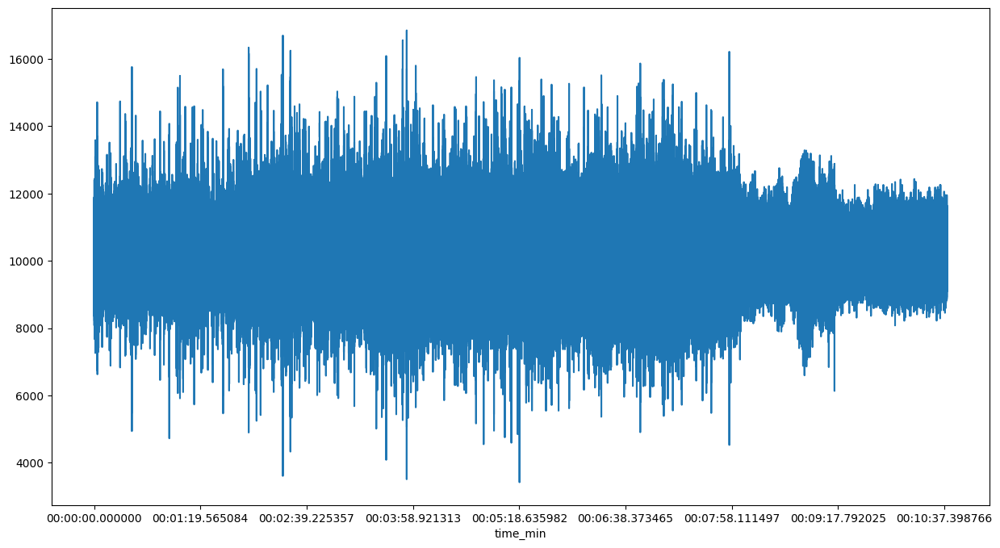

In [30]:
snowflake_clog0["magn"].plot(subplots=True, figsize=(15, 8))

array([<Axes: xlabel='time_min'>], dtype=object)

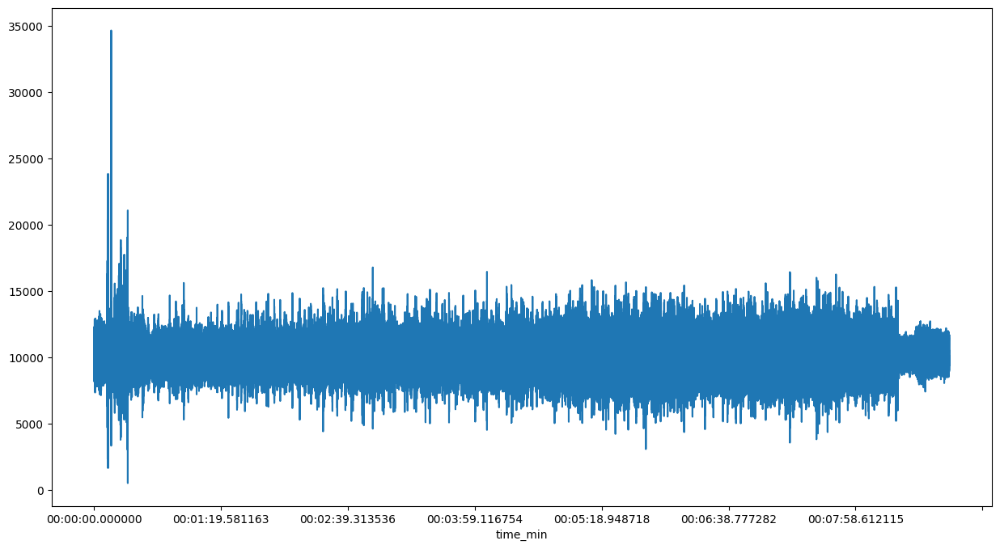

In [31]:
snowflake_partial0["magn"].plot(subplots=True, figsize=(15, 8))

For octopus:

In [30]:
octopus_clog0["magn"] = np.sqrt(octopus_clog0["x"]**2 + octopus_clog0["y"]**2 + octopus_clog0["z"]**2)
#octopus_clog0.head()

In [31]:
octopus_partial0["magn"] = np.sqrt(octopus_partial0["x"]**2 + octopus_partial0["y"]**2 + octopus_partial0["z"]**2)
#octopus_partial0.head()

array([<Axes: xlabel='time_min'>], dtype=object)

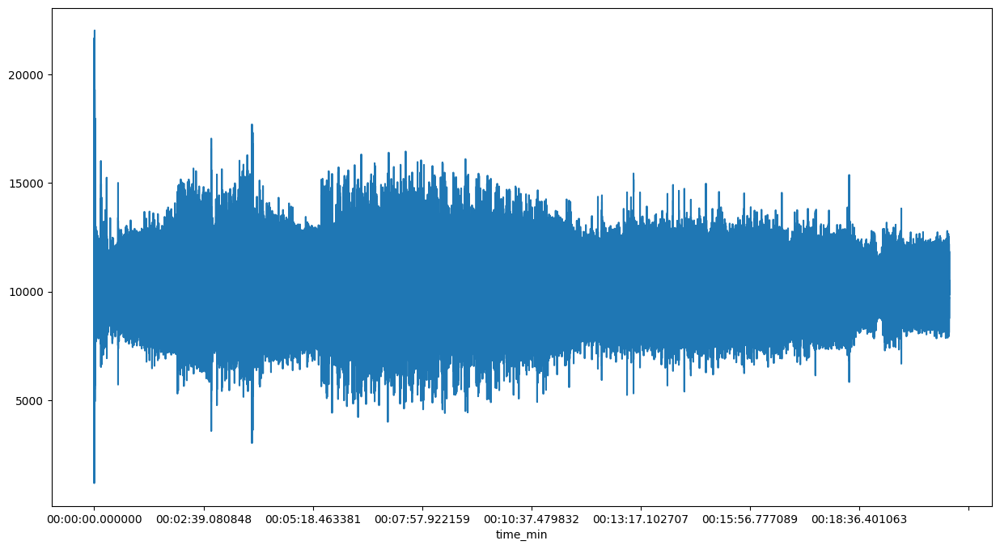

In [86]:
octopus_clog0["magn"].plot(subplots=True, figsize=(15, 8))

array([<Axes: xlabel='time_min'>], dtype=object)

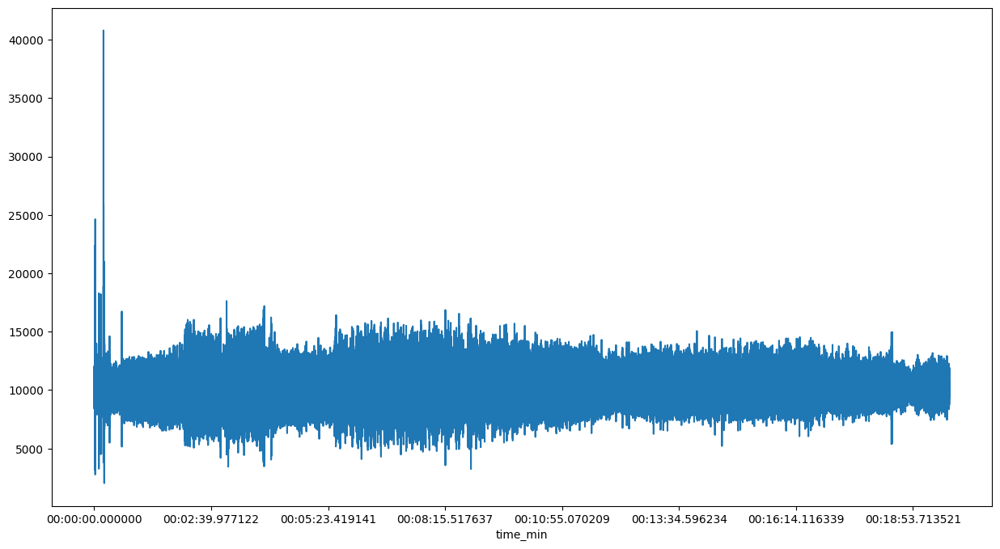

In [87]:
octopus_partial0["magn"].plot(subplots=True, figsize=(15, 8))

In [32]:
cylinder_clog0["magn"] = np.sqrt(cylinder_clog0["x"]**2 + cylinder_clog0["y"]**2 + cylinder_clog0["z"]**2)
cylinder_partial0["magn"] = np.sqrt(cylinder_partial0["x"]**2 + cylinder_partial0["y"]**2 + cylinder_partial0["z"]**2)


# 4. (For earlier prints with raw data only) Calculate Rolling Features Offline
I originally was collecting raw accelerometer data during the print and then computing statistical features (RMS, std, mean, etc) offline afterward, but since the runtime for computing each of those features was very long (~15 minutes per feature per axis), I switched to computing rolling features online during the print. So we can skip to Section 5 for more up-to-date code.

In [ ]:
# To calculate window size -- ADXL345 w/ SPI connection samples at close to 3200 Hz,
#   and we can use a 20ms (0.2s) window:
window = int(0.2*3200)
def compute_features(input_file, axis:str, window):
  input_file["rms_"+axis] = input_file[axis].rolling(window).apply(lambda x: np.sqrt(np.mean(x**2)))
  # finish this function later when data is finalized?

In [ ]:
# Line below (RMS on x axis with window 640) took 14min to execute

In [67]:
cube_clog0["rms_x"] = cube_clog0["x"].rolling(window).apply(lambda x: np.sqrt(np.mean(x**2)))

NameError: name 'cube_clog0' is not defined

In [ ]:
cube_clog0.head()

,timestamp,x,y,z,time_s,rms_x
time_min,,,,,,
00:00:00.000000,19155.636359,-666.185348,518.144159,-9806.022374,0.000000,NaN
00:00:00.000318,19155.636677,-666.185348,-148.041188,-10418.898773,0.000318,NaN
00:00:00.000636,19155.636995,-666.185348,-518.144159,-10189.070123,0.000636,NaN
00:00:00.000954,19155.637313,-888.247130,-666.185348,-10112.460574,0.000954,NaN
00:00:00.001272,19155.637631,-888.247130,-370.102971,-9959.241474,0.001272,NaN


array([<Axes: xlabel='time_min'>], dtype=object)

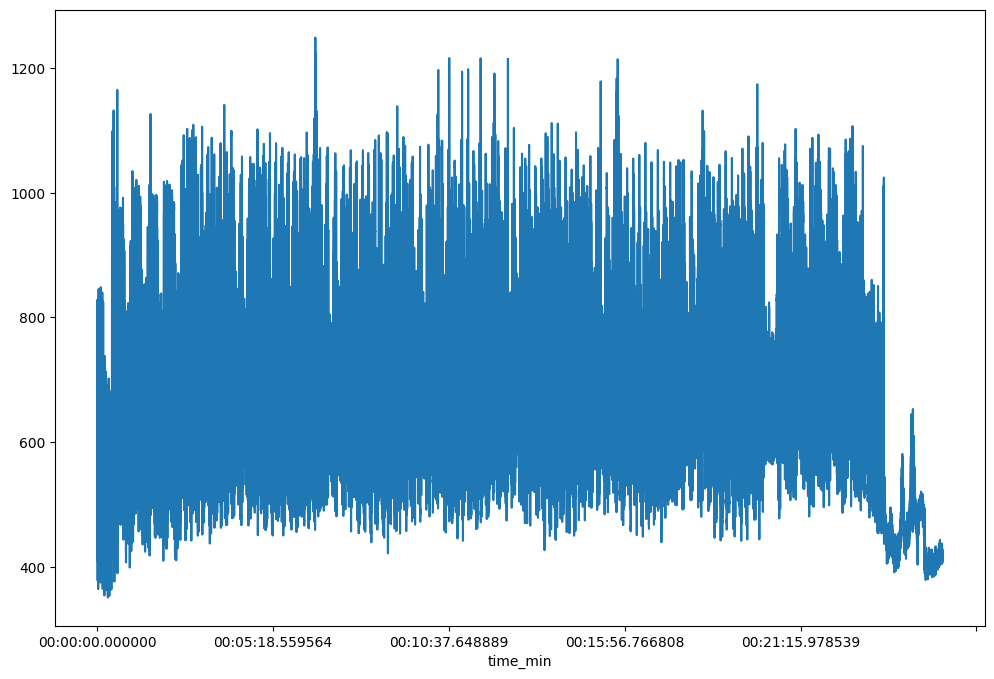

In [ ]:
cube_clog0["rms_x"].plot(subplots=True, figsize=(12, 8))

array([<Axes: xlabel='time_min'>], dtype=object)

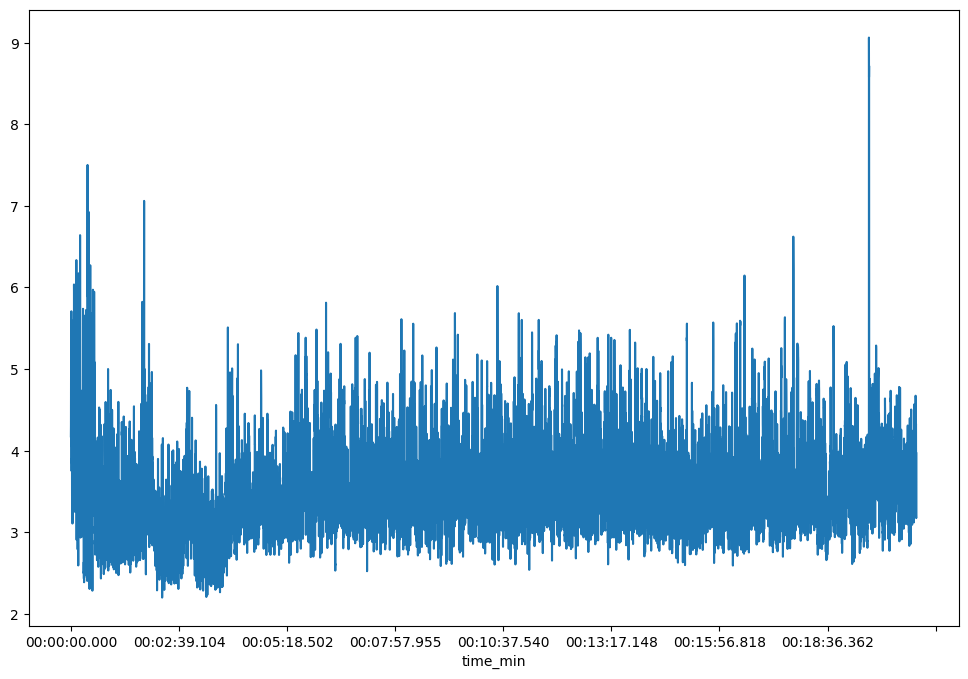

In [ ]:
octopus_clog0_features["x_kurt"].plot(subplots=True, figsize=(12, 8))

array([<Axes: xlabel='time_min'>], dtype=object)

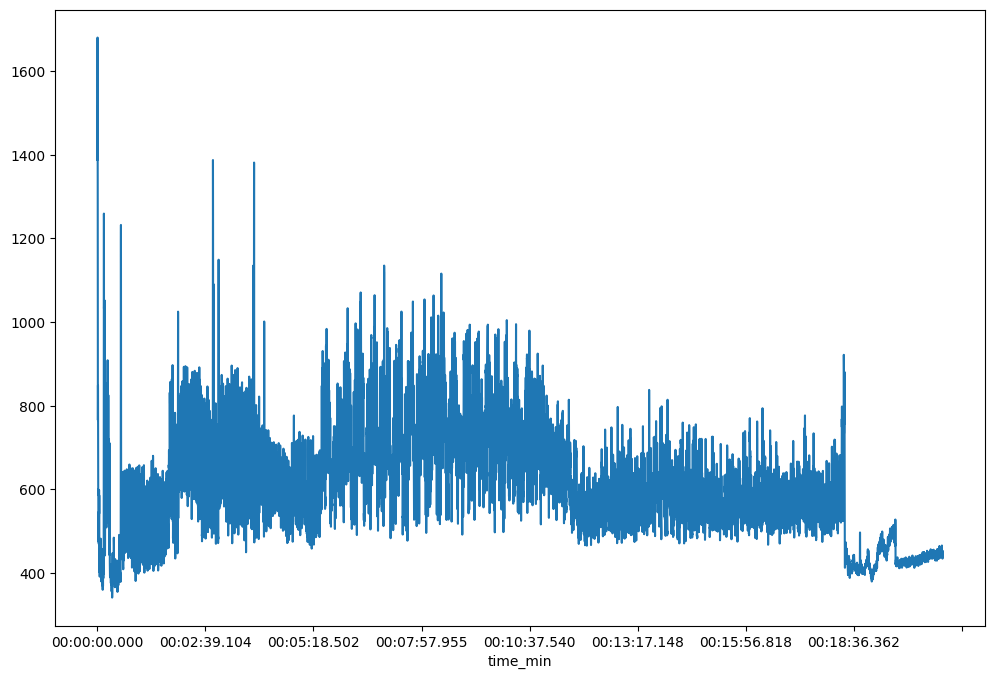

In [ ]:
octopus_clog0_features["x_rms"].plot(subplots=True, figsize=(12, 8))

# 5. Short-Time Fourier Transform - Spectrograms
##(For Visualizing Frequency Distribution)



In [ ]:
# Truncating prints to end at same time for clearer visualization
cutoff = 600
snowflake_clog0_features = snowflake_clog0_features[snowflake_clog0_features["time_s"] <= cutoff]
snowflake_partial0_features = snowflake_partial0_features[snowflake_partial0_features["time_s"] <= cutoff]



In [45]:
# SHORT-TIME FOURIER TRANSFORM
# Disclaimer: the code for this function is mostly from GPT (with my own additions) as STFT isn't part of this class and I don't have extensive signal processing background otherwise

def plot_adxl_stft(
    csv,
    descrip,
    signal_col="x",
    max_fs=2000.0,
    win_length_s=1.0,
    overlap=0.5
):
    """
    Plot STFT of ADXL accelerometer data.

    Parameters
    ----------
    csv_path : str
        Path to CSV file with ADXL data.
    signal_col : str, default="sa"
        Column to use as the vibration signal (e.g., "sa", "x", "y", "z").
    status_col : str, default="print_status"
        Column containing printer state ("preparing", "printing", etc.).
    max_fs : float, default=2000.0
        Maximum resampling frequency in Hz (helps control memory usage).
    win_length_s : float, default=1.0
        Window length for STFT in seconds.
    overlap : float, default=0.5
        Fractional overlap between windows (0–1).
    """

    # --- 0) Load data ---
    if isinstance(csv, str):
        df = pd.read_csv(csv)
    else:
        df = csv.copy()

    # --- 2) Extract signal + time, clean NaNs ---
    sig = df[signal_col].astype(float).values
    t_s = df["time_s"].astype(float).values
    #t_min = df["time_min"].astype(float).values
    t_min = df['time_s'].values / 60.0

    mask = np.isfinite(sig) & np.isfinite(t_s)
    sig, t_s, t_min = sig[mask], t_s[mask], t_min[mask]

    order = np.argsort(t_s)
    sig, t_s, t_min = sig[order], t_s[order], t_min[order]

    # --- 3) Estimate sampling rate & resample ---
    dt = np.median(np.diff(t_s))
    fs_est = 1.0 / dt
    fs_target = float(min(max_fs, fs_est))

    t_uniform = np.arange(t_s[0], t_s[-1], 1.0/fs_target)
    interp = interp1d(t_s, sig, kind="linear", bounds_error=False, fill_value="extrapolate")
    sig_uniform = interp(t_uniform)

    # --- 4) STFT parameters ---
    nperseg = int(round(fs_target * win_length_s))
    nperseg = max(nperseg, 128)
    noverlap = int(round(nperseg * overlap))

    f, tt_s, Zxx = scipy.signal.stft(sig_uniform, fs=fs_target, nperseg=nperseg, noverlap=noverlap, window="hann")
    S_db = 20 * np.log10(np.abs(Zxx) + 1e-12)

    start_min = (t_uniform[0] - t_s[0]) / 60.0 + t_min[0]
    tt_min = tt_s / 60.0 + start_min


    # --- 6) Plot ---
    plt.figure(figsize=(12, 6))
    pcm = plt.pcolormesh(tt_min, f, S_db, shading="gouraud")
    plt.xlabel("Time (min)")
    plt.ylabel("Frequency (Hz)")
    plt.title(f"Spectrogram of signal magnitude {descrip}")
    plt.ylim(0, fs_target/2.0)
    plt.colorbar(pcm, label="Magnitude (dB)")


    plt.tight_layout()
    plt.show()


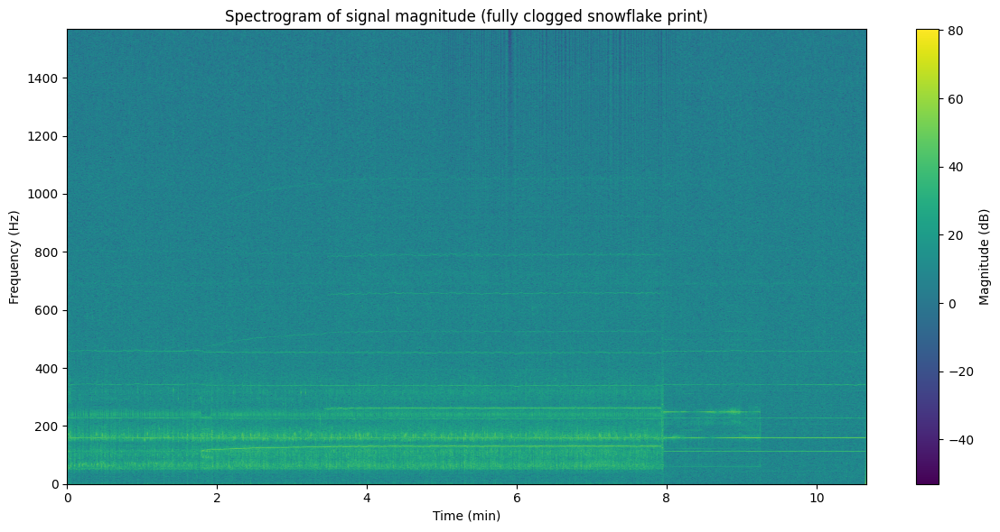

In [46]:
plot_adxl_stft(snowflake_clog0, "(fully clogged snowflake print)", "magn", 3200)


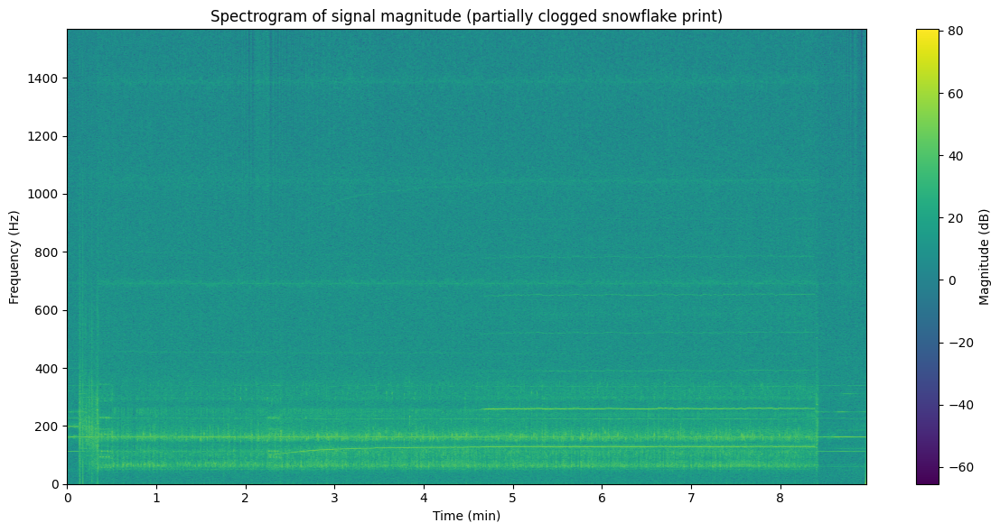

In [66]:
plot_adxl_stft(snowflake_partial0, "(partially clogged snowflake print)", "magn", 3200)

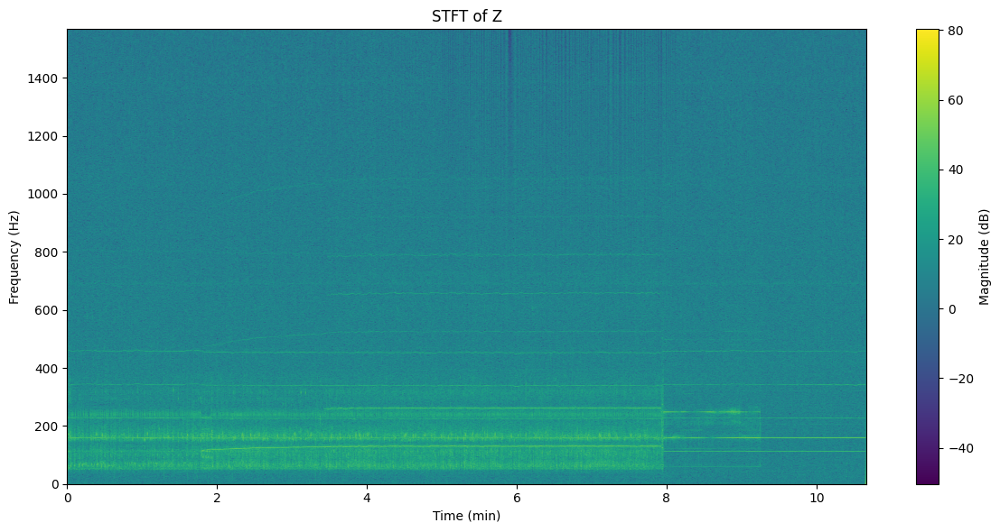

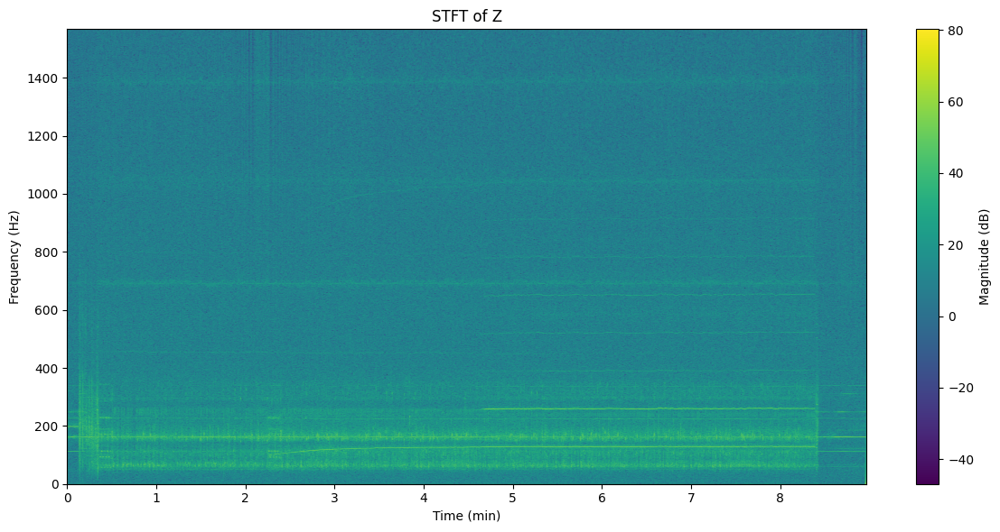

In [24]:
plot_adxl_stft(snowflake_clog0, "z", 3200)
plot_adxl_stft(snowflake_partial0, "z", 3200)

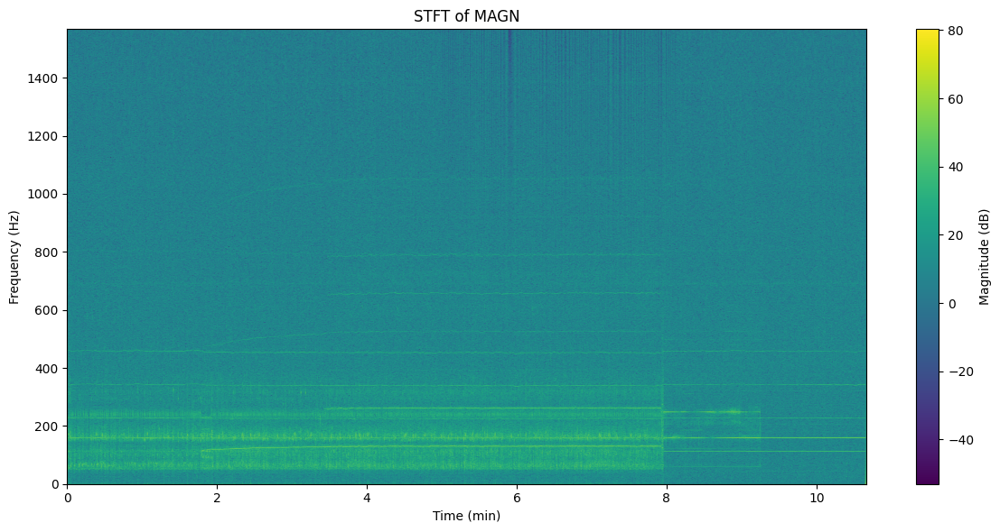

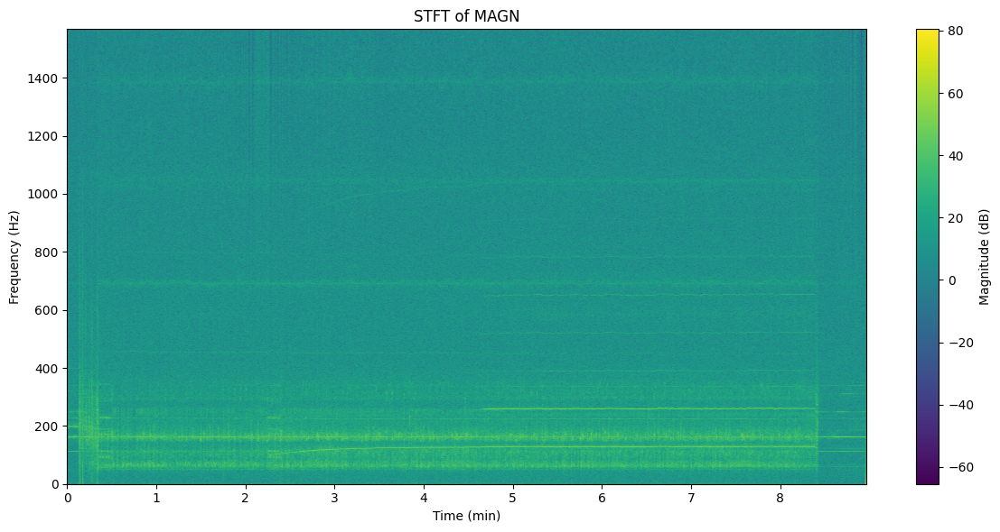

In [88]:
plot_adxl_stft(snowflake_clog0, "magn", 3200)
plot_adxl_stft(snowflake_partial0, "magn", 3200)

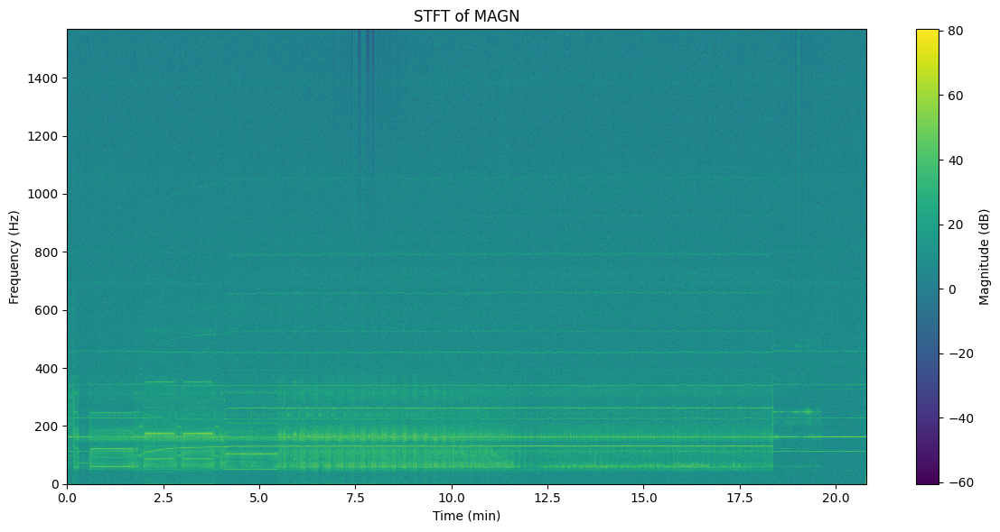

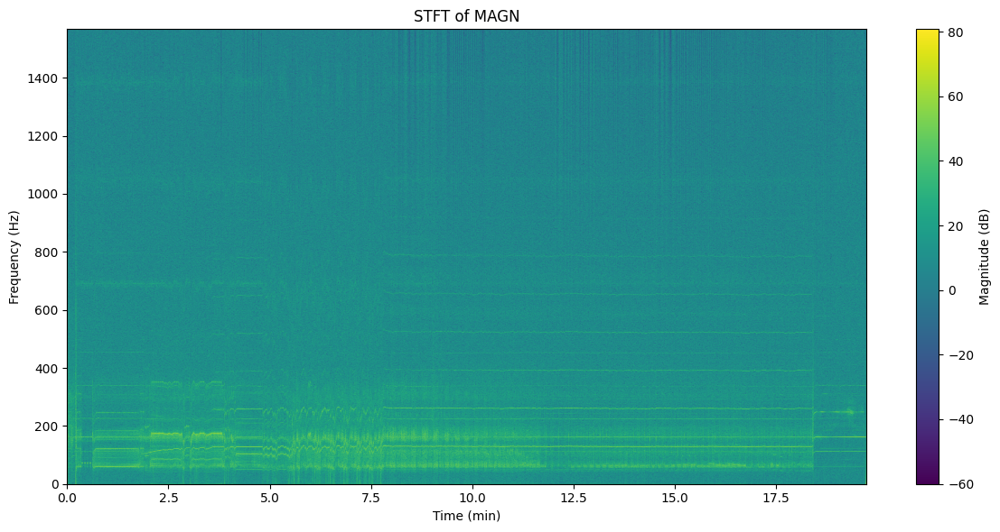

In [89]:
plot_adxl_stft(octopus_clog0, "magn", 3200)
plot_adxl_stft(octopus_partial0, "magn", 3200)

In [ ]:
# Plot of RMS on x axis with window 640 took 44s to execute

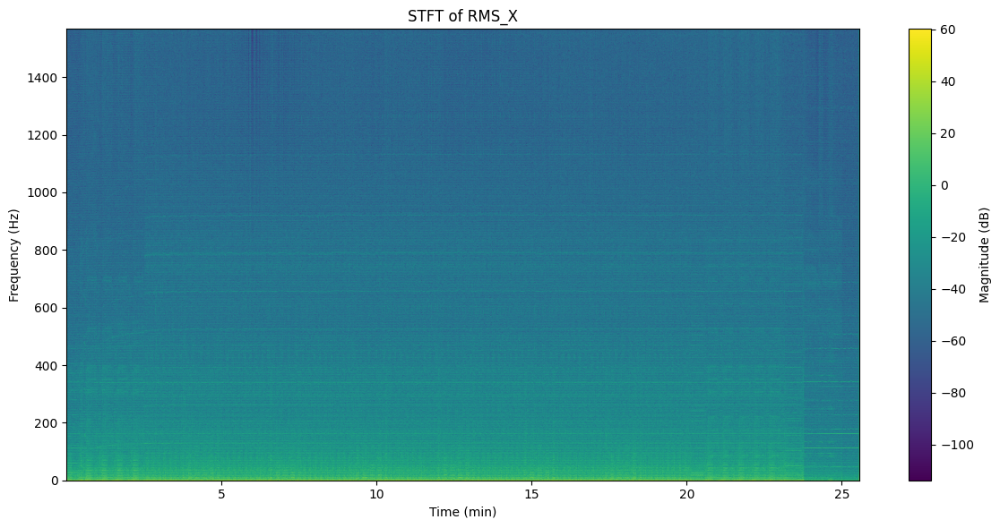

In [ ]:
plot_adxl_stft(cube_clog0, "rms_x", 3200)

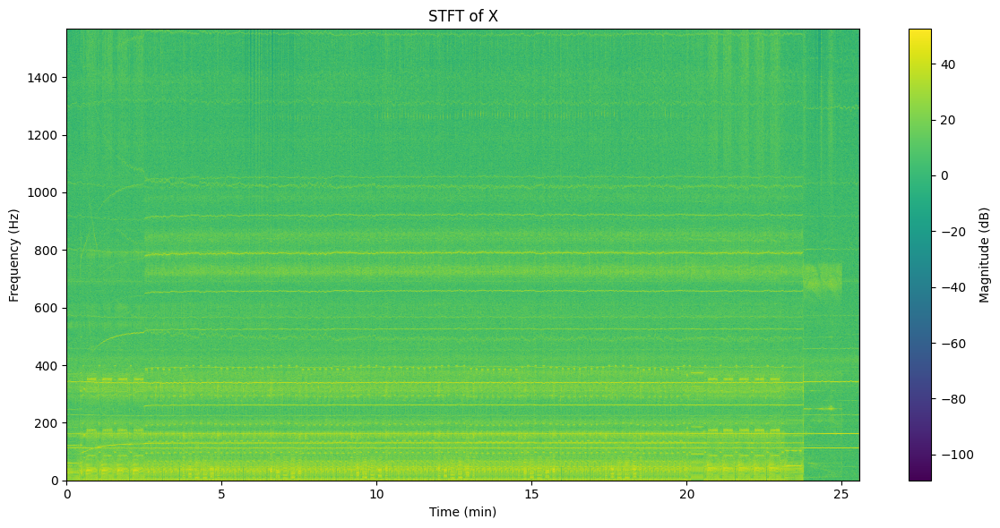

In [ ]:
plot_adxl_stft(cube_clog0, "x", 3200)

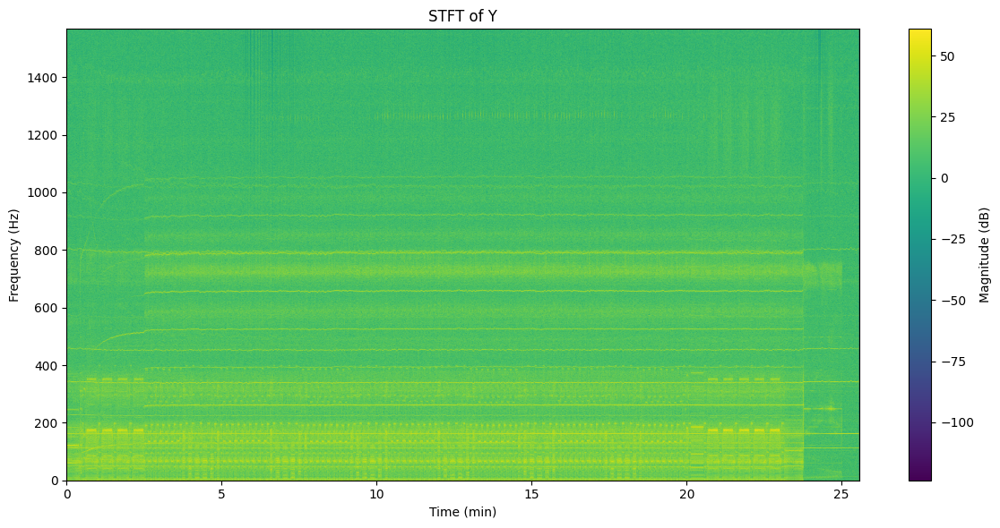

In [ ]:
plot_adxl_stft(cube_clog0, "y", 3200)

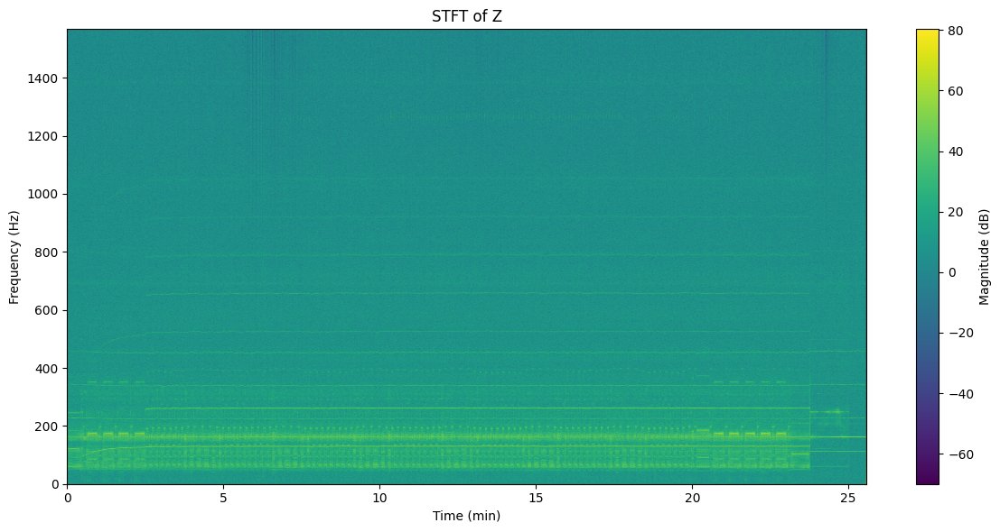

In [ ]:
plot_adxl_stft(cube_clog0, "z", 3200)

In [ ]:
# Spectrograms for high-ODR (3200Hz) clogged frog print

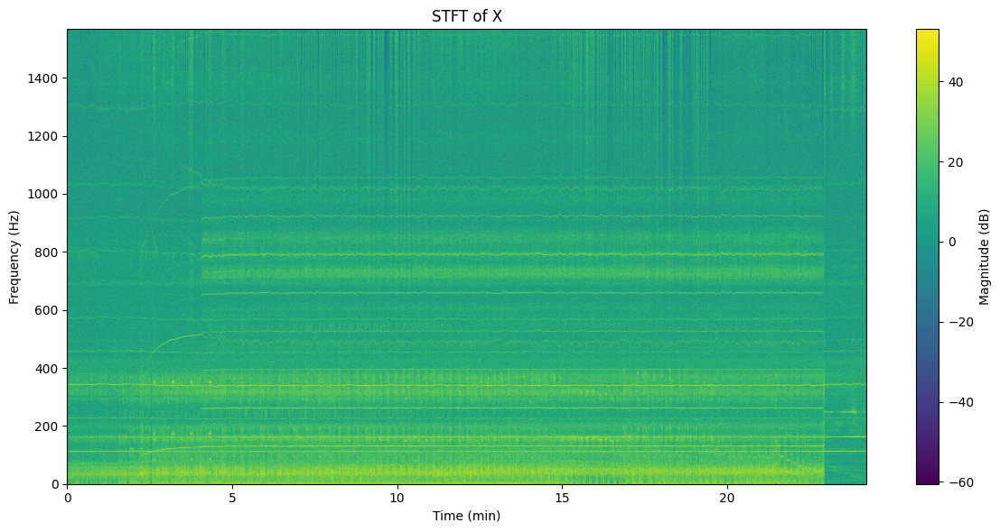

In [ ]:
plot_adxl_stft(frog_clog0, "x", 3200)

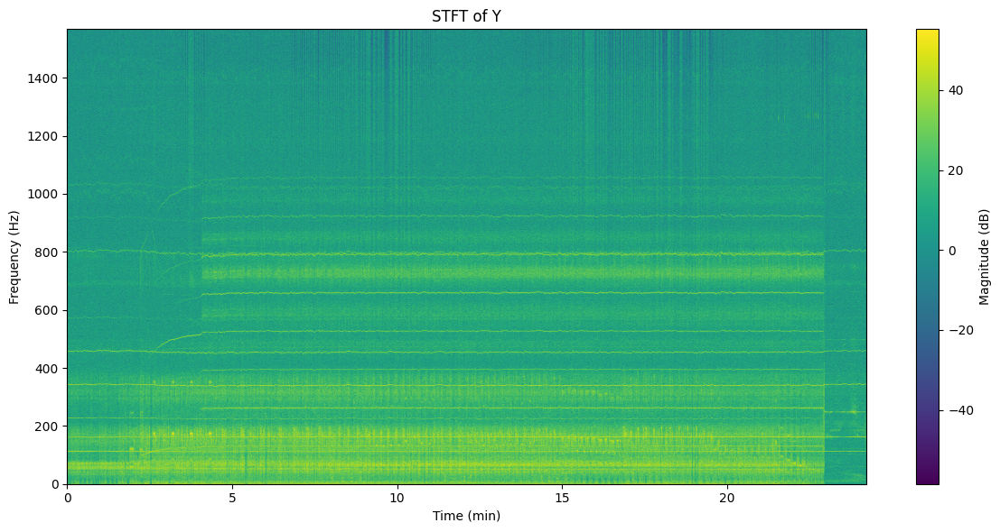

In [ ]:
plot_adxl_stft(frog_clog0, "y", 3200)

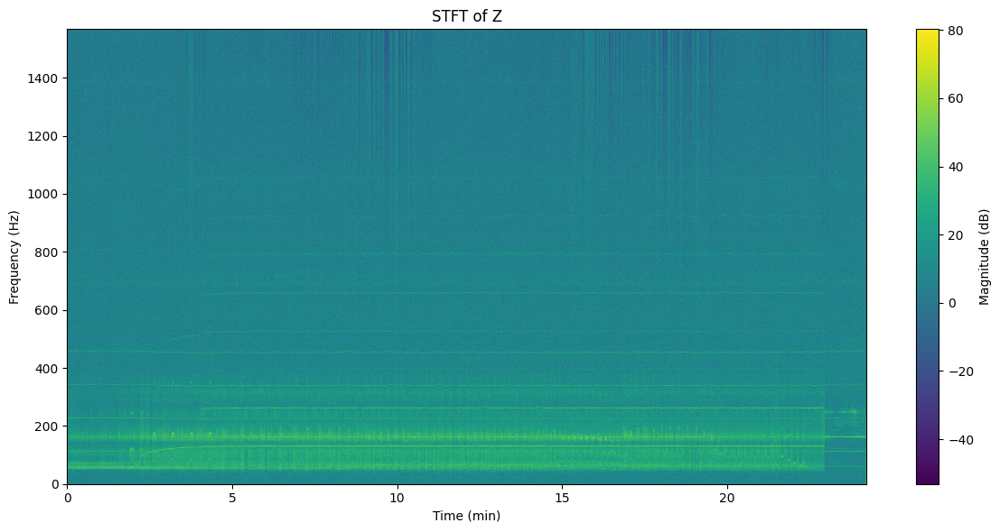

In [ ]:
plot_adxl_stft(frog_clog0, "z", 3200)

In [ ]:
# Octopus print

In [16]:
plot_adxl_stft(octopus_clog0, "x", 3200)

NameError: name 'plot_adxl_stft' is not defined

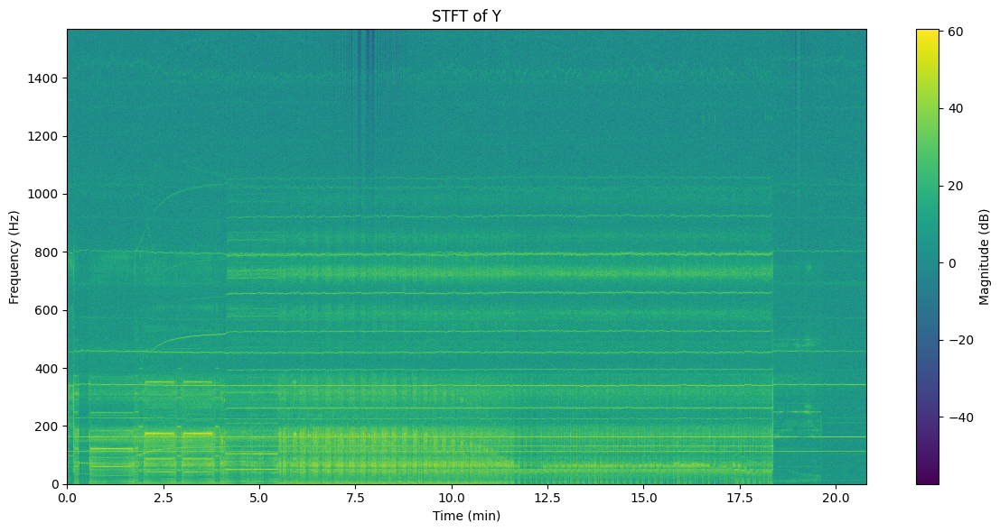

In [ ]:
plot_adxl_stft(octopus_clog0, "y", 3200)

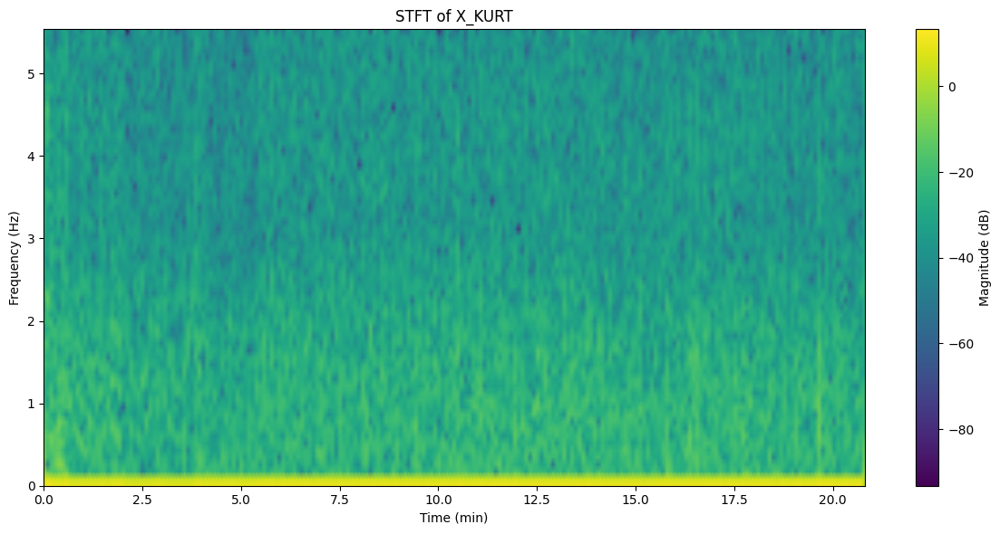

In [ ]:
plot_adxl_stft(octopus_clog0_features, "x_kurt", 3200)

# 6. Principal Component Analysis (PCA) on Feature Vectors

In [ ]:
# first going to truncate snowflake (clogged & partially clogged) log to 10min so that extra data after the print has ended doesn't interfere

In [37]:
# add clog (0) vs partial (1) labels
snowflake_clog0_features = snowflake_clog0_features.copy()
snowflake_partial0_features = snowflake_partial0_features.copy()

snowflake_clog0_features.loc[:, "label"] = 0
snowflake_partial0_features.loc[:, "label"] = 1


In [68]:
snowflake_partial0_features.head()

,timestamp,x_rms,y_rms,z_rms,x_std,y_std,z_std,x_mean,y_mean,z_mean,x_kurt,y_kurt,z_kurt,x_crest,y_crest,z_crest,time_s,label
time_min,,,,,,,,,,,,,,,,,,
00:00:00.000,2025-10-26 18:39:03.674534+00:00,591.331436,533.582502,-254.877579,2.083757,2.503523,716.561153,704.936178,128.549099,1.980983,2.582494,10356.860782,934.858975,-10314.582102,1.988845,1.190915,0.000000,1
00:00:00.088,2025-10-26 18:39:03.762876+00:00,594.744074,539.173718,-251.022340,2.102773,2.613616,712.460235,701.833070,122.596609,1.998832,2.597359,10359.056315,962.645897,-10314.230975,2.050080,1.220244,0.088342,1
00:00:00.188,2025-10-26 18:39:03.863487+00:00,598.597365,542.915522,-252.114144,2.117613,2.596791,716.934450,706.106309,124.132536,2.051108,2.581149,10358.960778,998.496838,-10310.726088,2.074871,1.242442,0.188953,1
00:00:00.202,2025-10-26 18:39:03.877251+00:00,600.822022,548.497253,-245.230229,2.122069,2.587176,736.982729,725.601768,129.017896,2.023288,2.510934,10374.814163,1062.878630,-10320.225673,2.118415,1.240543,0.202717,1
00:00:00.293,2025-10-26 18:39:03.967696+00:00,612.790387,563.405476,-241.011055,2.142452,2.536646,743.463084,732.012646,129.980163,2.071796,2.489047,10363.288996,1088.398547,-10305.976296,2.124986,1.241923,0.293162,1


In [69]:
snowflake_clog0_features.head()

,timestamp,x_rms,y_rms,z_rms,x_std,y_std,z_std,x_mean,y_mean,z_mean,x_kurt,y_kurt,z_kurt,x_crest,y_crest,z_crest,time_s,label
time_min,,,,,,,,,,,,,,,,,,
00:00:00.000,2025-10-23 15:50:21.733872+00:00,622.147388,570.434103,-248.339094,4.102317,3.688255,591.223327,573.083813,145.327100,2.853925,3.255175,10194.853079,665.482002,-10173.109801,2.729946,1.172267,0.000000,0
00:00:00.096,2025-10-23 15:50:21.830070+00:00,729.027701,684.414139,-251.114866,3.699379,3.249066,570.240889,552.079879,142.767221,2.985973,3.374952,10202.700602,691.991098,-10179.206644,2.757608,1.201400,0.096198,0
00:00:00.198,2025-10-23 15:50:21.932014+00:00,714.580570,688.506702,-191.269215,3.421200,3.314754,583.496414,562.164148,156.331495,2.927914,3.298282,10204.754082,675.005483,-10182.405093,2.772440,1.201159,0.198142,0
00:00:00.206,2025-10-23 15:50:21.940206+00:00,753.938905,727.994704,-196.080554,3.237414,3.141712,625.480591,596.787340,187.272103,3.412682,3.786942,10219.356445,707.796684,-10194.815840,2.752877,1.199442,0.206334,0
00:00:00.302,2025-10-23 15:50:22.036002+00:00,803.623016,770.408531,-228.649615,2.892329,2.947475,733.226202,694.039192,236.495798,4.450549,4.542836,10197.615993,752.132565,-10169.841126,2.812064,1.201999,0.302130,0


In [38]:
# concatenate the data for the clogged & partially clogged snowflakes
snowflake_feat_concat = pd.concat([snowflake_clog0_features, snowflake_partial0_features], ignore_index=True)
snowflake_feat_concat.head()

,timestamp,x_rms,y_rms,z_rms,x_std,y_std,z_std,x_mean,y_mean,z_mean,x_kurt,y_kurt,z_kurt,x_crest,y_crest,z_crest,time_s,label
0,2025-10-23 15:50:21.733872+00:00,622.147388,570.434103,-248.339094,4.102317,3.688255,591.223327,573.083813,145.327100,2.853925,3.255175,10194.853079,665.482002,-10173.109801,2.729946,1.172267,0.000000,0
1,2025-10-23 15:50:21.830070+00:00,729.027701,684.414139,-251.114866,3.699379,3.249066,570.240889,552.079879,142.767221,2.985973,3.374952,10202.700602,691.991098,-10179.206644,2.757608,1.201400,0.096198,0
2,2025-10-23 15:50:21.932014+00:00,714.580570,688.506702,-191.269215,3.421200,3.314754,583.496414,562.164148,156.331495,2.927914,3.298282,10204.754082,675.005483,-10182.405093,2.772440,1.201159,0.198142,0
3,2025-10-23 15:50:21.940206+00:00,753.938905,727.994704,-196.080554,3.237414,3.141712,625.480591,596.787340,187.272103,3.412682,3.786942,10219.356445,707.796684,-10194.815840,2.752877,1.199442,0.206334,0
4,2025-10-23 15:50:22.036002+00:00,803.623016,770.408531,-228.649615,2.892329,2.947475,733.226202,694.039192,236.495798,4.450549,4.542836,10197.615993,752.132565,-10169.841126,2.812064,1.201999,0.302130,0


In [47]:
# select feature columns for PCA (i.e. exclude 'timestamp', 'time_s', 'label')
feature_cols = [col for col in snowflake_feat_concat.columns if col not in ('timestamp', 'time_s', 'label')]
X = snowflake_feat_concat[feature_cols].values
y = snowflake_feat_concat['label'].values

In [48]:
# standardize using sklearn standard scaler
X_scaled = StandardScaler().fit_transform(X)

In [55]:
# apply PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

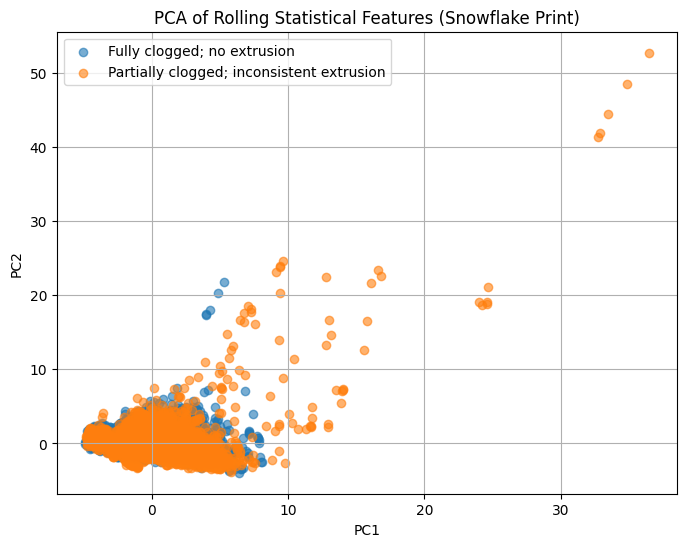

In [56]:
# plot PCA visualization
plt.figure(figsize=(8,6))
plt.scatter(X_pca[y==0, 0], X_pca[y==0, 1], label='Fully clogged; no extrusion', alpha=0.6)
plt.scatter(X_pca[y==1, 0], X_pca[y==1, 1], label='Partially clogged; inconsistent extrusion', alpha=0.6)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA of Rolling Statistical Features (Snowflake Print)")
plt.legend()
plt.grid(True)
plt.show()

In [57]:
loadings = pd.DataFrame(pca.components_.T, index=feature_cols, columns=['PC1', 'PC2'])
print("Feature loadings:")
print(loadings.sort_values('PC1', ascending=False))

Feature loadings:
              PC1       PC2
x_mean   0.378746 -0.124830
z_std    0.378316 -0.124290
z_crest  0.361445  0.024342
x_rms    0.351812 -0.165927
y_rms    0.351650 -0.151132
z_kurt   0.345462 -0.190100
x_std    0.223920  0.382973
y_crest  0.211327  0.394487
x_crest  0.201975 -0.080795
y_std    0.197495  0.305751
z_mean   0.124054  0.500584
x_kurt   0.034355  0.442858
y_kurt   0.008766 -0.016947
z_rms   -0.092701  0.136733
y_mean  -0.127184  0.117797


In [71]:
print(snowflake_feat_concat["label"].value_counts())

label
0    9413
1    8421
Name: count, dtype: int64


For octopus:

In [90]:
octopus_clog0_features = octopus_clog0_features.copy()
octopus_partial0_features = octopus_partial0_features.copy()

octopus_clog0_features.loc[:, "label"] = 0
octopus_partial0_features.loc[:, "label"] = 1

In [91]:
# concatenate the data for the clogged & partially clogged print
octopus_feat_concat = pd.concat([octopus_clog0_features, octopus_partial0_features], ignore_index=True)
octopus_feat_concat.head()

,timestamp,x_rms,y_rms,z_rms,x_std,y_std,z_std,x_mean,y_mean,z_mean,x_kurt,y_kurt,z_kurt,x_crest,y_crest,z_crest,time_s,label
0,2025-10-23 16:36:55.384982+00:00,1456.520168,1436.391961,-241.307137,5.927882,5.132837,1772.704373,1766.787971,144.710262,5.505807,4.175575,10528.023074,2197.184946,-10296.195811,5.046612,1.862842,0.000000,0
1,2025-10-23 16:36:55.483878+00:00,1426.911354,1402.141709,-264.716150,5.798158,5.239344,1737.768439,1729.972771,164.418245,5.261976,4.259520,10529.113795,2258.367668,-10284.065965,5.783210,1.979065,0.098896,0
2,2025-10-23 16:36:55.583806+00:00,1387.261267,1365.400911,-245.304249,5.677633,5.389093,1717.778628,1711.540257,146.264694,5.199720,4.309088,10509.520753,2278.517413,-10259.550909,5.382885,1.982754,0.198824,0
3,2025-10-23 16:36:55.592148+00:00,1516.150661,1494.261081,-256.703421,7.931846,6.053853,1814.431844,1809.312867,136.197893,5.833454,5.140229,10489.495826,2148.727407,-10267.058645,5.649251,1.986539,0.207166,0
4,2025-10-23 16:36:55.680922+00:00,1493.129511,1471.436556,-253.594556,8.085420,6.147192,1856.905122,1851.727827,138.566552,5.571898,5.022656,10550.832020,2459.810451,-10260.087176,4.918883,1.974991,0.295940,0


In [99]:
# verify that both dataframes were successfully concatenated
print(octopus_feat_concat["label"].value_counts())

label
0    19553
1    18276
Name: count, dtype: int64


In [92]:
# select feature columns for PCA (i.e. exclude 'timestamp', 'time_s', 'label')
oct_feature_cols = [col for col in octopus_feat_concat.columns if col not in ('timestamp', 'time_s', 'label')]
X_oct = octopus_feat_concat[oct_feature_cols].values
y_oct = octopus_feat_concat['label'].values

In [93]:
# standardize using sklearn standard scaler
X_scaled_oct = StandardScaler().fit_transform(X_oct)

In [104]:
# apply PCA
pca_oct = PCA(n_components=2)
X_pca_oct = pca_oct.fit_transform(X_scaled_oct)

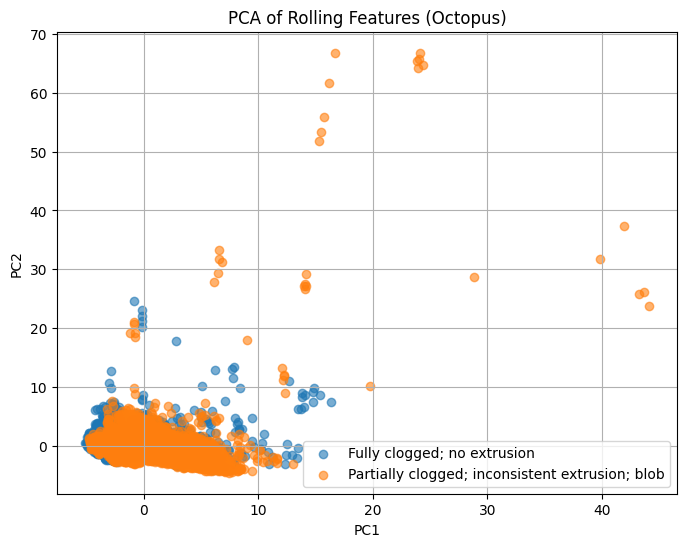

In [105]:
# plot PCA visualization
plt.figure(figsize=(8,6))
plt.scatter(X_pca_oct[y_oct==0, 0], X_pca_oct[y_oct==0, 1], label='Fully clogged; no extrusion', alpha=0.6)
plt.scatter(X_pca_oct[y_oct==1, 0], X_pca_oct[y_oct==1, 1], label='Partially clogged; inconsistent extrusion; blob', alpha=0.6)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA of Rolling Features (Octopus)")
plt.legend()
plt.grid(True)
plt.show()

In [106]:
loadings = pd.DataFrame(pca_oct.components_.T, index=oct_feature_cols, columns=['PC1', 'PC2'])
print("Feature loadings:")
print(loadings.sort_values('PC1', ascending=False))

Feature loadings:
              PC1       PC2
x_mean   0.396601 -0.105360
z_std    0.396516 -0.105835
z_kurt   0.385595 -0.111714
z_crest  0.381732  0.061263
y_rms    0.372326  0.041839
x_rms    0.369406  0.023262
y_kurt   0.174980  0.020199
y_crest  0.156655  0.418603
x_crest  0.152062 -0.118864
x_std    0.120997  0.437482
y_std    0.062730  0.344986
z_mean   0.003809  0.509064
z_rms   -0.074773  0.080831
x_kurt  -0.077076  0.426308
y_mean  -0.087115  0.107634


For cylinder:

In [58]:
cylinder_clog0_features = cylinder_clog0_features.copy()
cylinder_partial0_features = cylinder_partial0_features.copy()

cylinder_clog0_features.loc[:, "label"] = 0
cylinder_partial0_features.loc[:, "label"] = 1

In [59]:
# concatenate the data for the clogged & partially clogged prints
cylinder_feat_concat = pd.concat([cylinder_clog0_features, cylinder_partial0_features], ignore_index=True)
cylinder_feat_concat.head()

,timestamp,x_rms,y_rms,z_rms,x_std,y_std,z_std,x_mean,y_mean,z_mean,x_kurt,y_kurt,z_kurt,x_crest,y_crest,z_crest,time_s,label
0,2025-10-26 17:31:36.625495+00:00,365.134921,284.422361,-228.970371,3.524908,3.446261,335.564563,317.978527,107.206494,3.054515,3.088194,10283.105942,398.447898,-10275.383549,2.713447,1.117506,0.000000,0
1,2025-10-26 17:31:36.714872+00:00,363.992086,283.823843,-227.890904,3.278436,3.457081,335.009637,316.042787,111.123417,3.108653,3.093309,10274.706270,404.699045,-10266.733054,2.862182,1.118420,0.089377,0
2,2025-10-26 17:31:36.812705+00:00,363.334820,281.947387,-229.167760,3.196498,3.463335,342.028013,323.682088,110.512747,3.093979,3.462668,10279.688804,412.095116,-10271.425389,2.958299,1.117877,0.187210,0
3,2025-10-26 17:31:36.829033+00:00,364.418954,281.532579,-231.388377,2.841592,2.843673,337.610194,317.650780,114.361818,3.172668,3.507979,10280.749545,423.132451,-10272.038266,2.826779,1.117762,0.203538,0
4,2025-10-26 17:31:36.923951+00:00,365.252445,280.345914,-234.127139,2.799610,2.837184,344.159945,322.262376,120.801610,3.133863,3.441218,10284.861021,431.812743,-10275.792134,2.837106,1.124764,0.298456,0


In [60]:
# verify that both dataframes were successfully concatenated
print(cylinder_feat_concat["label"].value_counts())

label
1    21366
0     9958
Name: count, dtype: int64


In [61]:
# select feature columns for PCA (i.e. exclude 'timestamp', 'time_s', 'label')
cyl_feature_cols = [col for col in cylinder_feat_concat.columns if col not in ('timestamp', 'time_s', 'label')]
X_cyl = cylinder_feat_concat[cyl_feature_cols].values
y_cyl = cylinder_feat_concat['label'].values

In [62]:
# standardize using sklearn standard scaler
X_scaled_cyl = StandardScaler().fit_transform(X_cyl)

In [63]:
# apply PCA
pca_cyl = PCA(n_components=2)
X_pca_cyl = pca_cyl.fit_transform(X_scaled_cyl)

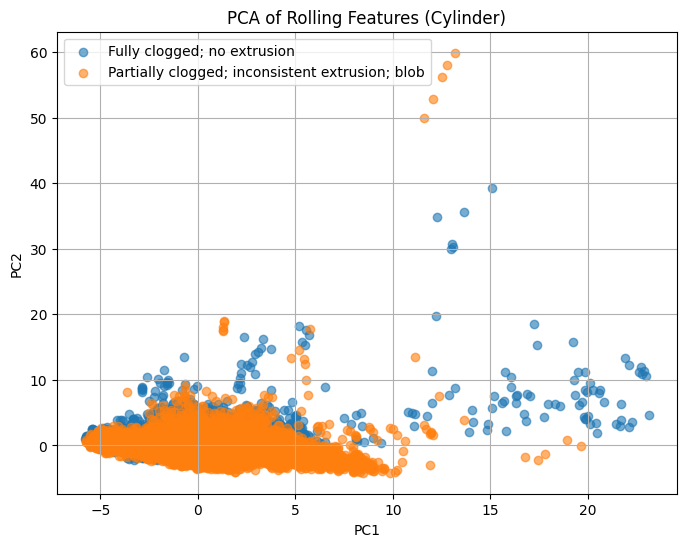

In [65]:
# plot PCA visualization
plt.figure(figsize=(8,6))
plt.scatter(X_pca_cyl[y_cyl==0, 0], X_pca_cyl[y_cyl==0, 1], label='Fully clogged; no extrusion', alpha=0.6)
plt.scatter(X_pca_cyl[y_cyl==1, 0], X_pca_cyl[y_cyl==1, 1], label='Partially clogged; inconsistent extrusion; blob', alpha=0.6)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA of Rolling Features (Cylinder)")
plt.legend()
plt.grid(True)
plt.show()

#

#